In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.3/896.3 kB 15.6 MB/s eta 0:00:00a 0:00:01


In [2]:
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 2.6 MB/s eta 0:00:00


In [3]:
!pip install -U ipywidgets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 3.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.4/214.4 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 48.2 MB/s eta 0:00:0000:01
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.9
    Uninstalling widgetsnbextension-3.6.9:
      Successfully uninstalled widgetsnbextension-3.6.9
  Attempting uninstall: jupyterlab-widgets
    Found existing installation: jupyterlab_widgets 3.0.11
    Uninstalling jupyterlab_widgets-3.0.11:
      Successfully uninstalled jupyterlab_widgets-3.0.11
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
big

In [4]:
!pip install tensorboard

In [5]:
from roboflow import Roboflow
rf = Roboflow(api_key="anqxzUbaYuOd49B0O32W")

workspace = rf.workspace("workspace-4c3re")

project = workspace.project("brain-tumor-mri-bczdy")

dataset = project.version(3).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Brain-Tumor-MRI-3 in yolov8:: 100%|██████████| 7818/7818 [00:00<00:00, 9213.07it/s] 


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [6]:
ls /kaggle/working

Brain-Tumor-MRI-3/


In [9]:
data_yaml_path = "/kaggle/working/Brain-Tumor-MRI-3/data.yaml"

In [10]:
from ultralytics import YOLO

model = YOLO('yolov8m.yaml')

model.train(
    data=data_yaml_path, 
    epochs=50,                            
    imgsz=640,                            
    lr0=0.0001,
    batch=24,
    optimizer='AdamW',
    name="train_result_yolov8",  
    project="/kaggle/working/runs/train_yolov8"
)

Ultralytics 8.3.38 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=/kaggle/working/Brain-Tumor-MRI-3/data.yaml, epochs=50, time=None, patience=100, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/kaggle/working/runs/train_yolov8, name=train_result_yolov82, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, sav

100%|██████████| 755k/755k [00:00<00:00, 16.8MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 70.4MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/Brain-Tumor-MRI-3/train/labels... 3005 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3005/3005 [00:02<00:00, 1183.92it/s]


train: New cache created: /kaggle/working/Brain-Tumor-MRI-3/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.21 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /kaggle/working/Brain-Tumor-MRI-3/valid/labels... 478 images, 0 backgrounds, 0 corrupt: 100%|██████████| 478/478 [00:00<00:00, 1202.75it/s]


val: New cache created: /kaggle/working/Brain-Tumor-MRI-3/valid/labels.cache
Plotting labels to /kaggle/working/runs/train_yolov8/train_result_yolov82/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005625000000000001), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/runs/train_yolov8/train_result_yolov82
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50        10G      3.236      3.827      3.364         13        640: 100%|██████████| 126/126 [01:45<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.35it/s]

                   all        478        520          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50        10G      2.459      2.417      2.852          8        640: 100%|██████████| 126/126 [01:57<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.13it/s]

                   all        478        520      0.739      0.401      0.497       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50        10G      1.929      1.821      2.403          9        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520      0.687      0.615      0.697      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      10.1G      1.685      1.523      2.139         17        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.29it/s]

                   all        478        520      0.751      0.713      0.767      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      10.1G      1.533      1.387      1.965         11        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520      0.786      0.746      0.821       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      10.1G       1.47      1.293      1.867         10        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520      0.843      0.763      0.851      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      10.1G      1.368      1.203      1.777          8        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.849      0.755      0.862      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      10.1G       1.31      1.142        1.7          8        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520      0.877      0.827      0.892      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      10.1G      1.259      1.072      1.646         11        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520      0.853      0.835      0.905      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      10.1G      1.233      1.036      1.602         10        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.865      0.821      0.908      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      10.1G      1.196      0.999      1.558         11        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520      0.851      0.874      0.917      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      10.1G      1.182     0.9562      1.545          7        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.872      0.869      0.917      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      10.1G      1.145     0.9234      1.511          9        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520      0.779      0.825      0.843      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      10.1G      1.147     0.9393       1.51         18        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        478        520      0.871      0.874      0.924      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      10.1G      1.123      0.904      1.479          4        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.893      0.866      0.927      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      10.1G      1.106     0.8887      1.467          7        640: 100%|██████████| 126/126 [01:57<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520      0.887      0.861      0.915      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      10.1G      1.083     0.8568      1.447         12        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520       0.89      0.819      0.905      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      10.1G       1.08     0.8445      1.434          7        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.894      0.858      0.926      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      10.1G      1.062     0.8052      1.422         10        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        478        520      0.925      0.885      0.938      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      10.1G      1.041     0.7992      1.405          6        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.913        0.9      0.938      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      10.1G      1.038     0.7982      1.397         13        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.941      0.876      0.937      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      10.1G       1.02     0.7747       1.38         11        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        478        520      0.923      0.865      0.931      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      10.1G      1.019     0.7702      1.382         15        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.936      0.896      0.945      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      10.1G     0.9882     0.7397      1.348          8        640: 100%|██████████| 126/126 [01:57<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520        0.9      0.882      0.952      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      10.1G     0.9923     0.7479      1.356         10        640: 100%|██████████| 126/126 [01:57<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.918      0.871      0.937      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50        10G     0.9907     0.7414      1.355          5        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520      0.942      0.896      0.944      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      10.1G     0.9752     0.7193      1.345         13        640: 100%|██████████| 126/126 [01:57<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520       0.93      0.886      0.946      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      10.1G     0.9677     0.7113      1.332          8        640: 100%|██████████| 126/126 [01:57<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520       0.94      0.903       0.95      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      10.1G      0.951     0.7001      1.316         11        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520      0.914      0.912      0.947      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      10.1G     0.9519     0.6905      1.324         10        640: 100%|██████████| 126/126 [01:57<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520      0.938      0.901      0.953      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      10.1G     0.9426     0.6762      1.311         12        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.935      0.918      0.957      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      10.1G     0.9451     0.6821      1.317         13        640: 100%|██████████| 126/126 [01:57<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        478        520      0.948      0.902      0.951      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      10.1G     0.9219     0.6561      1.292         12        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.933      0.904      0.954      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      10.1G     0.9081     0.6407       1.29          6        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        478        520      0.929      0.901      0.953      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      10.1G     0.9126     0.6332      1.284         15        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        478        520      0.925      0.912      0.949       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      10.1G     0.9007      0.642      1.272         11        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        478        520      0.938        0.9      0.953      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50        10G     0.8887     0.6291      1.278          7        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        478        520      0.959      0.893      0.958      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      10.1G     0.8977     0.6166      1.284          9        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        478        520      0.947      0.909      0.955      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      10.1G     0.8766     0.6105      1.265          9        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.941      0.907      0.959      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      10.1G     0.8921     0.6142      1.268          6        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.958      0.895      0.957      0.743


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      10.1G     0.7956     0.5521      1.227          5        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520       0.93      0.913      0.951      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      10.1G     0.7686     0.5139      1.206          6        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        478        520      0.939      0.912      0.959      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      10.1G     0.7576     0.5018      1.193          9        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        478        520      0.957      0.903      0.959      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      10.1G     0.7533     0.4974       1.19          5        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.957      0.899      0.956      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      10.1G     0.7407     0.4866      1.183          8        640: 100%|██████████| 126/126 [01:57<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520       0.95      0.906      0.958      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50        10G     0.7262     0.4723       1.17          5        640: 100%|██████████| 126/126 [01:56<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        478        520      0.951      0.911      0.955      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      10.1G     0.7186     0.4671      1.161          7        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        478        520      0.955      0.903      0.958       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      10.1G     0.7122      0.465      1.162          5        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        478        520      0.955      0.903      0.955      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      10.1G     0.7133     0.4581      1.159          6        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.955      0.907      0.959      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      10.1G     0.7079     0.4623      1.157          8        640: 100%|██████████| 126/126 [01:56<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        478        520      0.958      0.903      0.958      0.758



50 epochs completed in 1.748 hours.
Optimizer stripped from /kaggle/working/runs/train_yolov8/train_result_yolov82/weights/last.pt, 52.0MB
Optimizer stripped from /kaggle/working/runs/train_yolov8/train_result_yolov82/weights/best.pt, 52.0MB

Validating /kaggle/working/runs/train_yolov8/train_result_yolov82/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.38 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 218 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.21it/s]


                   all        478        520      0.951       0.91      0.955      0.762
                Glioma        117        132      0.912      0.826      0.921      0.705
            Meningioma        134        136      0.977      0.958      0.972      0.802
              No Tumor         91         91          1      0.968      0.995      0.848
             Pituitary        154        161      0.917      0.889      0.933      0.695
Speed: 0.2ms preprocess, 12.8ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to /kaggle/working/runs/train_yolov8/train_result_yolov82


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7841d8491120>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


# Hyperparameter tuning using Grid Search

In [ ]:
# import itertools

# lr = [0.001, 0.0001, 0.00001]
# batch_sizes = [8, 16, 32]
# weight_decays = [0.0005, 0.001]

# hyperparameters_grid = list(itertools.product(lr, batch_size, weight_decays))

# def train_with_params(lr0, batch_size, weight_decay):
#     print(f"Training with lr0={lr0}, batch_size={batch_size}, imgsz={imgsz}, optimizer={optimizer}, weight_decay={weight_decay}, momentum={momentum}")
    
#     model.train(
#         data=data_yaml_path,
#         epochs=5,
#         batch=batch_size,
#         imgsz=640,
#         lr0=lr0,
#         optimizer='AdamW',
#         weight_decay=weight_decay,
#         name=f"grid_search_lr{lr0}_bs{batch_size}_img{imgsz}",
#         project="/kaggle/working/runs/grid_search"
#     )

In [ ]:
# for params in hyperparameters_grid:
#     lr, batch_size, weight_decays = params
#     train_with_params(lr, batch_size, weight_decay)

In [ ]:
# best_model_path = "runs/grid_search/best_model.pt"
# best_model = YOLO(best_model_path)

# After Train Model

In [11]:
import os
print(os.listdir('/kaggle/working/runs/train_yolov8/train_result_yolov82'))

['labels_correlogram.jpg', 'confusion_matrix.png', 'args.yaml', 'val_batch1_labels.jpg', 'events.out.tfevents.1732804783.98d54a463520.30.0', 'results.png', 'val_batch2_pred.jpg', 'val_batch1_pred.jpg', 'confusion_matrix_normalized.png', 'R_curve.png', 'F1_curve.png', 'train_batch0.jpg', 'val_batch0_pred.jpg', 'P_curve.png', 'train_batch5041.jpg', 'weights', 'train_batch5040.jpg', 'val_batch2_labels.jpg', 'train_batch5042.jpg', 'train_batch1.jpg', 'labels.jpg', 'PR_curve.png', 'train_batch2.jpg', 'results.csv', 'val_batch0_labels.jpg']


In [12]:
!zip -r file.zip /kaggle/working/runs/train_yolov8/train_result_yolov82

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


  adding: kaggle/working/runs/train_yolov8/train_result_yolov82/ (stored 0%)
  adding: kaggle/working/runs/train_yolov8/train_result_yolov82/labels_correlogram.jpg (deflated 37%)
  adding: kaggle/working/runs/train_yolov8/train_result_yolov82/confusion_matrix.png (deflated 28%)
  adding: kaggle/working/runs/train_yolov8/train_result_yolov82/args.yaml (deflated 53%)
  adding: kaggle/working/runs/train_yolov8/train_result_yolov82/val_batch1_labels.jpg (deflated 19%)
  adding: kaggle/working/runs/train_yolov8/train_result_yolov82/events.out.tfevents.1732804783.98d54a463520.30.0 (deflated 91%)
  adding: kaggle/working/runs/train_yolov8/train_result_yolov82/results.png (deflated 9%)
  adding: kaggle/working/runs/train_yolov8/train_result_yolov82/val_batch2_pred.jpg (deflated 17%)
  adding: kaggle/working/runs/train_yolov8/train_result_yolov82/val_batch1_pred.jpg (deflated 18%)
  adding: kaggle/working/runs/train_yolov8/train_result_yolov82/confusion_matrix_normalized.png (deflated 26%)
  ad

In [13]:
!ls

Brain-Tumor-MRI-3  file.zip  runs  yolo11n.pt


In [19]:
from IPython.display import FileLink
FileLink(r'file.zip')

/kaggle/working/file.zip

In [ ]:
# !tensorboard --logdir=/kaggle/working/custom-yolov8

# Validation Model

In [15]:
!yolo task=detect mode=val model=/kaggle/working/runs/train_yolov8/train_result_yolov82/weights/best.pt data=/kaggle/working/Brain-Tumor-MRI-3/data.yaml

Ultralytics 8.3.38 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 218 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /kaggle/working/Brain-Tumor-MRI-3/valid/labels.cache... 478 images
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        478        520      0.951      0.911      0.955      0.762
                Glioma        117        132      0.909      0.826      0.921      0.706
            Meningioma        134        136      0.978      0.959      0.972      0.801
              No Tumor         91         91          1      0.968      0.995      0.848
             Pituitary        154        161      0.917      0.892      0.933      0.695
Speed: 0.8ms preprocess, 30.6ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


# Evaluation Model

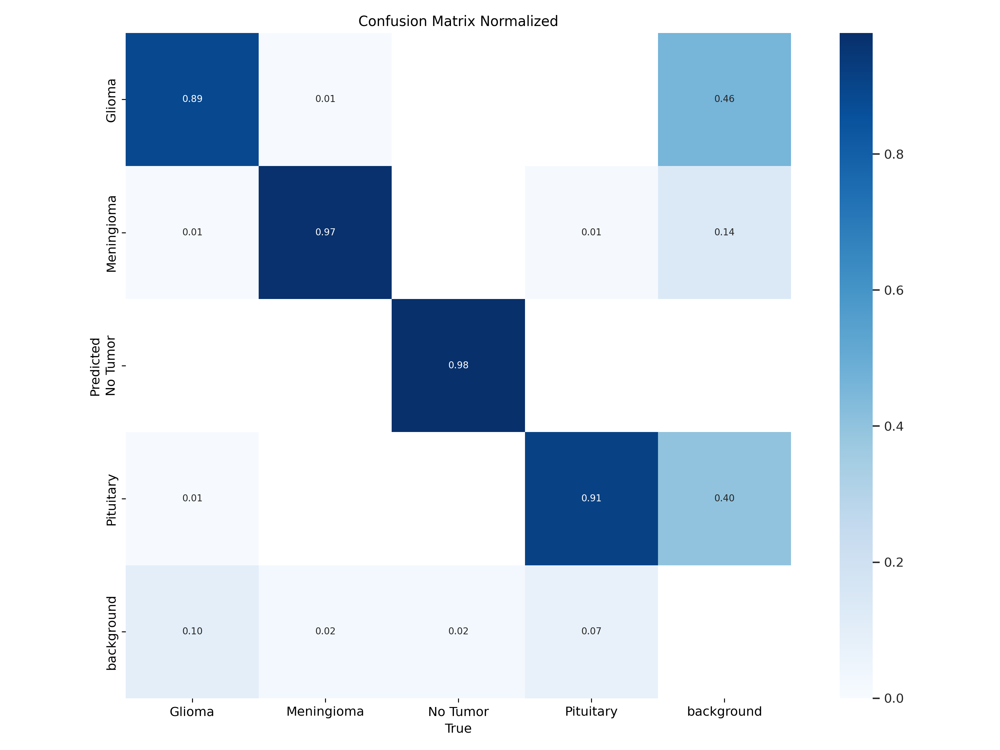

In [16]:
from IPython.display import Image

# Path ke gambar confusion matrix
confusion_matrix_path = '/kaggle/working/runs/train_yolov8/train_result_yolov82/confusion_matrix_normalized.png'

# Menampilkan gambar
Image(filename=confusion_matrix_path, width=800)

In [17]:
# Pindah ke direktori kerja jika diperlukan
%cd /kaggle/working

# Menjalankan YOLOv8 untuk inference
!yolo task=detect mode=predict \
    model=/kaggle/working/runs/train_yolov8/train_result_yolov82/weights/best.pt \
    conf=0.25 \
    source=/kaggle/working/Brain-Tumor-MRI-3/test/images \
    save=True

/kaggle/working
Ultralytics 8.3.38 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 218 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs

image 1/420 /kaggle/working/Brain-Tumor-MRI-3/test/images/Te-gl_0175_jpg.rf.de95d7b8c89aa8a9ad442f1244dce130.jpg: 640x640 2 Gliomas, 36.9ms
image 2/420 /kaggle/working/Brain-Tumor-MRI-3/test/images/Te-gl_0177_jpg.rf.6b954bcb4dbc916f6afba54015e7d6dc.jpg: 640x640 1 Glioma, 37.0ms
image 3/420 /kaggle/working/Brain-Tumor-MRI-3/test/images/Te-gl_0178_jpg.rf.af5f4779a6c2631e65f50b3cb1e10f86.jpg: 640x640 1 Glioma, 37.0ms
image 4/420 /kaggle/working/Brain-Tumor-MRI-3/test/images/Te-gl_0183_jpg.rf.171c8af6884425617c5b3cb2d774403d.jpg: 640x640 1 Glioma, 36.9ms
image 5/420 /kaggle/working/Brain-Tumor-MRI-3/test/images/Te-gl_0184_jpg.rf.03cfbe94f2f0f918a715f4132cee0bbe.jpg: 640x640 3 Gliomas, 32.5ms
image 6/420 /kaggle/working/Brain-Tumor-MRI-3/test/images/Te-gl_0187_jpg.rf.c50b822dc55979b32bedb801e54cb580.jpg: 640x640 1 G

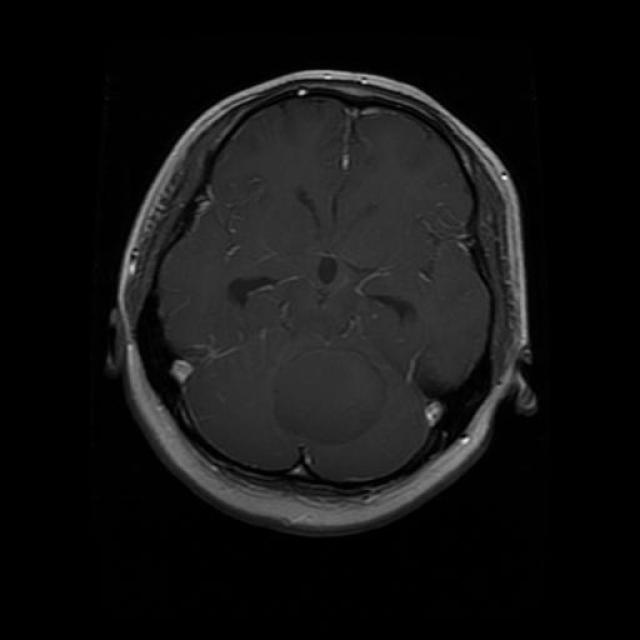

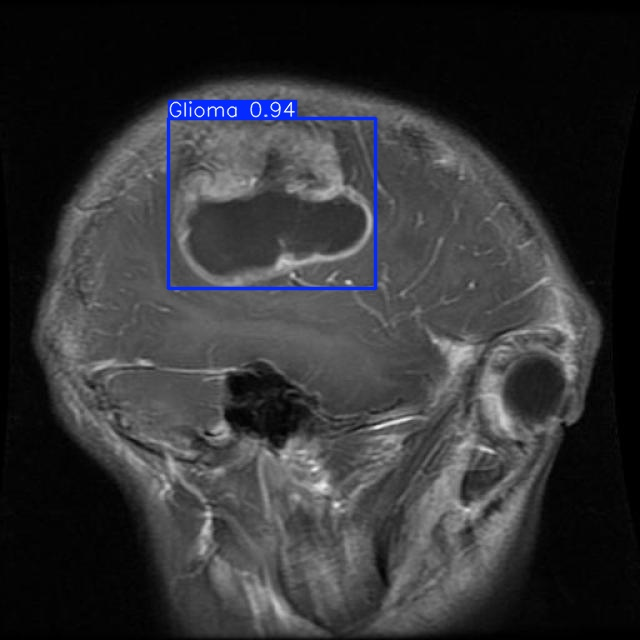

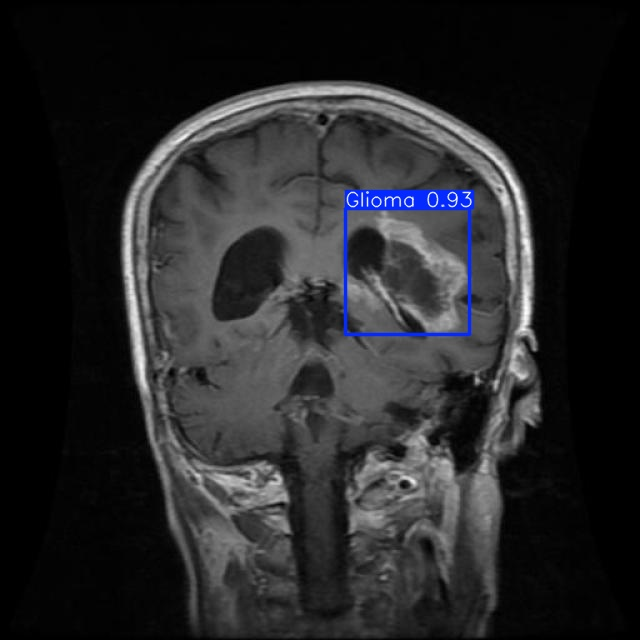

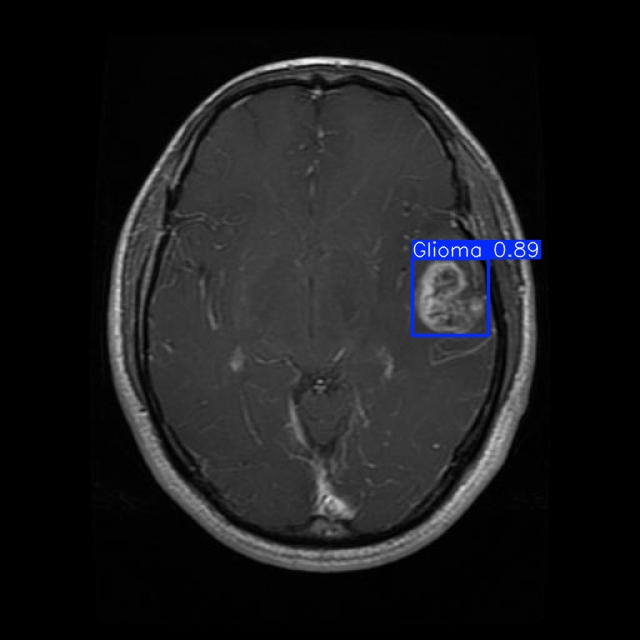

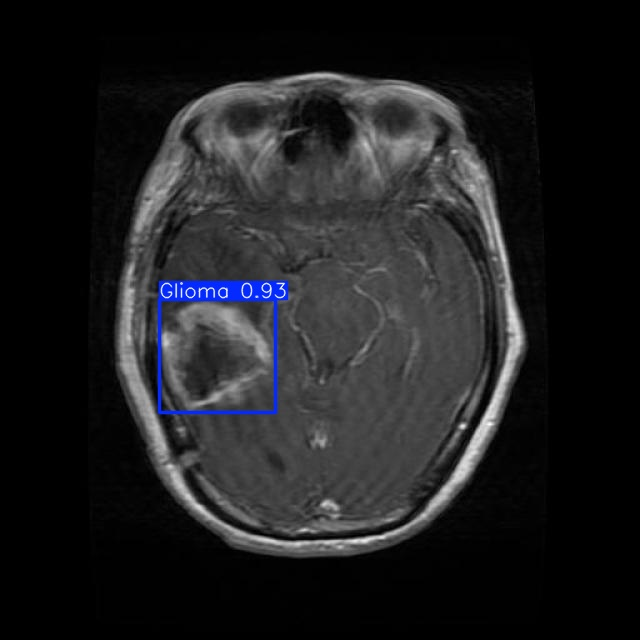

...

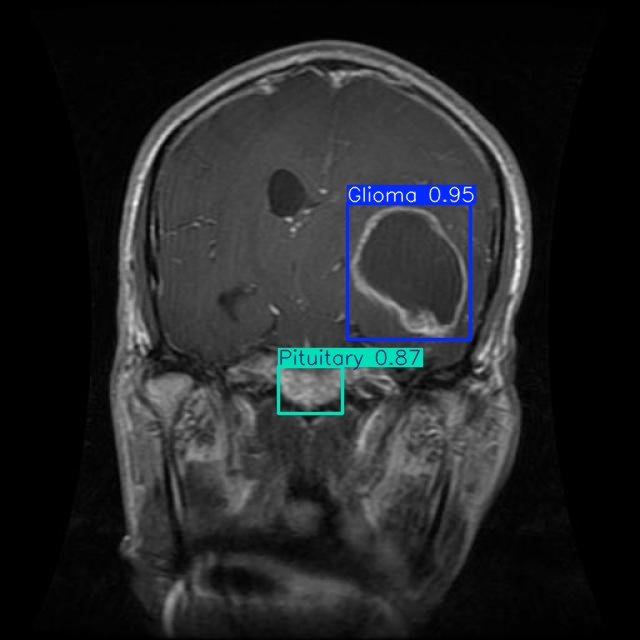

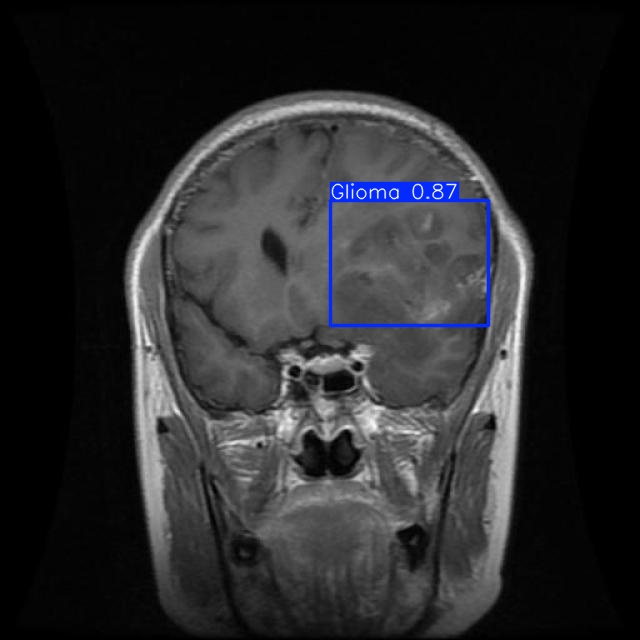

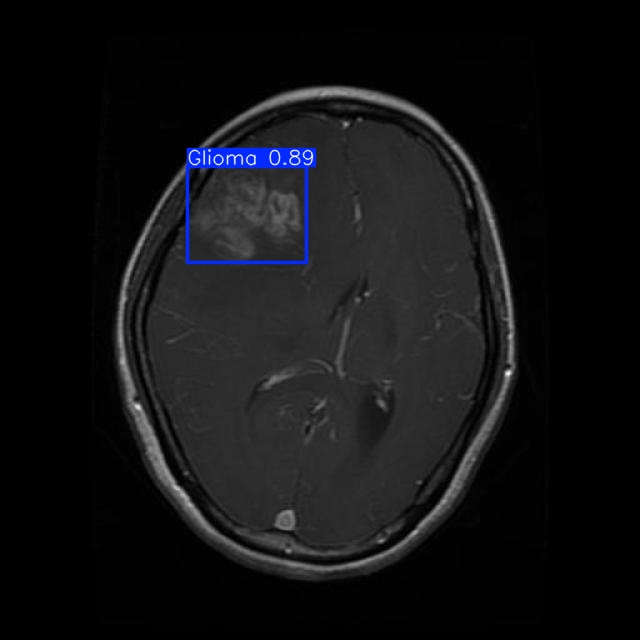

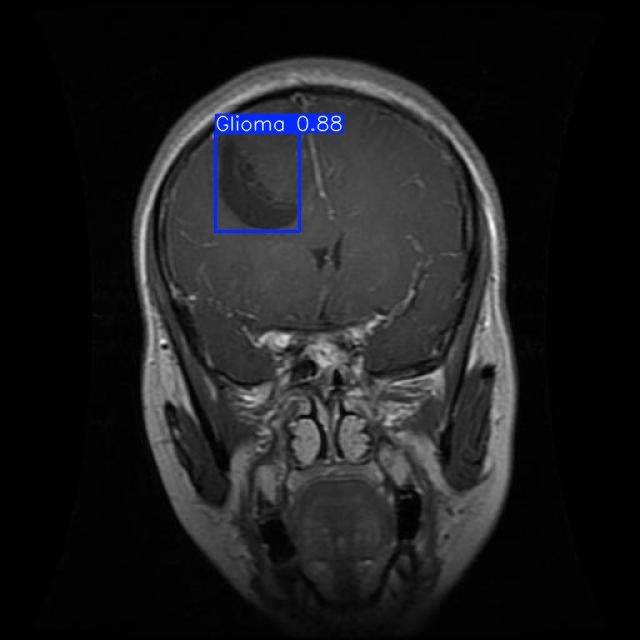

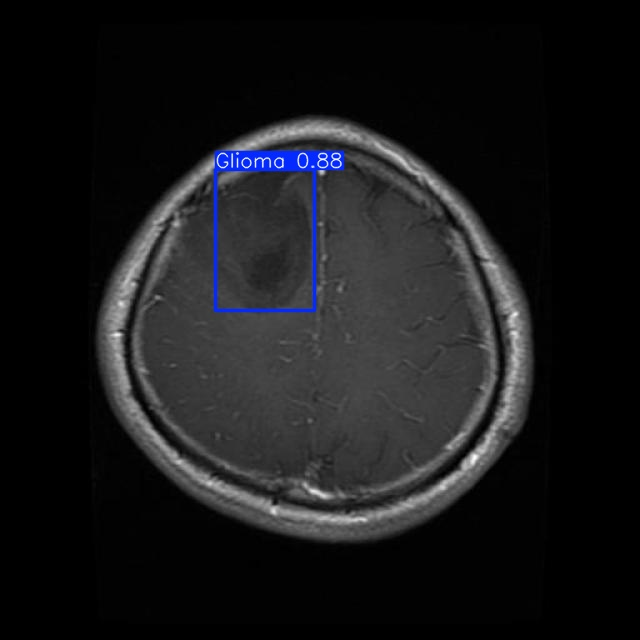

In [18]:
import glob
from IPython.display import Image, display

# Define the base path where the folders are located
base_path = '/kaggle/working/runs/detect/'

# List all directories that start with 'predict' in the base path
subfolders = [os.path.join(base_path, d) for d in os.listdir(base_path)
              if os.path.isdir(os.path.join(base_path, d)) and d.startswith('predict')]

# Find the latest folder by modification time
latest_folder = max(subfolders, key=os.path.getmtime)

image_paths = glob.glob(f'{latest_folder}/*.jpg')[:150]

# Display each image
for image_path in image_paths:
    display(Image(filename=image_path, width=420))
    print("\n")